<details>
   <summary>Metadata</summary>
    title: "E-TRAINEE Tutorial - Raster time series processing in Python using xarray"<br>
    description: "This is a tutorial within the first theme of Module 1 of the E-TRAINEE course."<br>
    lastUpdate: 2023-07-20<br>
    authors: Andreas Mayr<br>
</details>

# Raster time series processing in Python using xarray

This tutorial provides an introduction to raster time series processing with Python using (mainly) the [xarray](https://docs.xarray.dev/en/stable/) package ([Hoyer and Hamman 2017](https://doi.org/10.5334/jors.148)) for multi-dimensional data. Xarray's data structures (`DataArray` and `Dataset`, see [here](https://docs.xarray.dev/en/stable/user-guide/terminology.html)) complement NumPy-like arrays by labels in the form of dimensions, coordinates and attributes, thereby encoding information about how the array values are absolutely related to space, time etc. The labels can also be used to access and analyse the array values. These properties and functionality are very useful if you work with time series of remote sensing images or other raster data. Many of the visualizations in this tutorial could be improved with a few lines of code (e.g. to add axes labels and plot titles) or by using specialized plotting packages, but here we try to keep the code simple.

The Python packages used in this tutorial are contained in the requirements file provided for the course. Please see the instructions on the [software page](https://3dgeo-heidelberg.github.io/etrainee/software/software_python.html) for setting up a Conda environment based on this file.

Data:

As a sample dataset, we use a time series of **Sentinel-2 satellite data** covering a relatively small area around the village of [Obergurgl](https://opentopomap.org/#marker=14/46.87002/11.02611), located in the Central Alps of Tyrol (Austria), and the years 2018 to 2021. This imagery has been queried from the [Google Earth Engine](https://earthengine.google.com/) (GEE), then cloud-masked and exported from GEE as 6-band GeoTiffs, one GeoTiff per scene (see theme 2 for a tutorial on exporting cloudless Sentinel-2 imagery from GEE). You find this dataset in a folder named `s2` in the data repository of the course.

## Getting started with xarray's data structures and basic tools

### Loading and handling single images

Before we deal with a time series of satellite images, we start with importing and exploring an individual image. So we load a single GeoTiff file with six bands, which is part of the image collection subset downloaded from the GEE. A good way to do this is using [rioxarray](https://corteva.github.io/rioxarray/stable/index.html), a geospatial xarray extension powered by rasterio.

In [289]:
import rioxarray
import xarray
import pathlib

In [292]:
# Open a GeoTiff from a local directory using the rio accessor
in_dir = pathlib.Path('F:/data/etrainee/gee/s2')        # Define the path to the s2 directory with the Sentinel-2 image subsets on your local system
in_file = in_dir / '20180726T102019_20180726T102150_T32TPS.tif' # Specify the path and the filename of an image
xds = rioxarray.open_rasterio(in_file, masked=True)     # Read the mask (NoData in the GeoTiff) and set values to NaN (for proper interpretation by xarray)

Print some information about the xarray.DataArray called 'xds':

In [293]:
xds

<xarray.DataArray (band: 6, y: 201, x: 251)>
[302706 values with dtype=float32]
Coordinates:
  * band         (band) int32 1 2 3 4 5 6
  * x            (x) float64 6.516e+05 6.516e+05 ... 6.566e+05 6.566e+05
  * y            (y) float64 5.194e+06 5.194e+06 5.194e+06 ... 5.19e+06 5.19e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0

Or more specifically:

In [4]:
print(xds.shape)
print(xds.dims)
print(xds.coords)

(6, 201, 251)
('band', 'y', 'x')
Coordinates:
  * band         (band) int32 1 2 3 4 5 6
  * x            (x) float64 6.516e+05 6.516e+05 ... 6.566e+05 6.566e+05
  * y            (y) float64 5.194e+06 5.194e+06 5.194e+06 ... 5.19e+06 5.19e+06
    spatial_ref  int32 0


... and some descriptive statistics for one band (using xarray's built-in methods, but numpy could be used as well):

In [10]:
# Extract a band to a new DataArray (for conveniance)
band_1 =xds.sel(band=1)
print('min: ', band_1.min().values)     # Print only the value(s) of the array; its only one value for one band and one time stamp 
print('max: ', band_1.max().values)
print('mean: ', band_1.mean().values)
print('std: ', band_1.std().values)

min:  138.0
max:  6651.0
mean:  666.3916
std:  358.31658935546875


We can use the extended capabilities of rioxarray to query more metadata, such as coordinate reference system (CRS), bounding coordinates, dimensions, spatial resolution, or defined NoData value:

In [11]:
print(xds.rio.crs)
print(xds.rio.bounds())
print(xds.rio.width)
print(xds.rio.height)
print(xds.rio.resolution())
print(xds.rio.nodata)

EPSG:32632
(651580.0, 5189740.0, 656600.0, 5193760.0)
251
201
(20.0, -20.0)
nan


Creating a new DataArray with only one selected band is straigthforward and plotting this is easy as well (matplotlib must be installed in the active conda environment). Note the white NoData areas due to cloud masking:

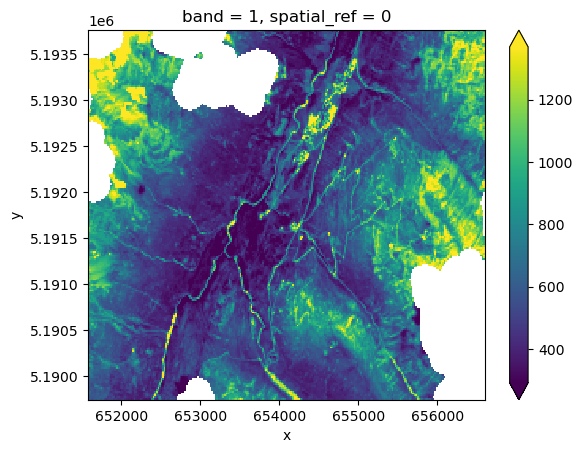

In [12]:
band_1 = xds.sel(band=1)            # Select a band by its label (or by its index with '.isel()'), as already shown above
band_1.plot.imshow(robust=True)     # The 'robust' option stretches the colormap range to 2nd and 98th percentiles.

Now let's create a histogram for this band. We use [xarray.plot.hist()](https://docs.xarray.dev/en/latest/generated/xarray.plot.hist.html), for more advanced options there are the [xhistogram](https://xhistogram.readthedocs.io/en/latest/index.html) and the [boost-histogram](https://boost-histogram.readthedocs.io/en/latest/notebooks/xarray.html) packages. You might try different estimators to determine the optimum number of bins (see [here](https://numpy.org/doc/stable/reference/generated/numpy.histogram_bin_edges.html#numpy.histogram_bin_edges); default would be 10 bins; 'auto' takes the maximum of the Sturges and Freedman Diaconis estimators).

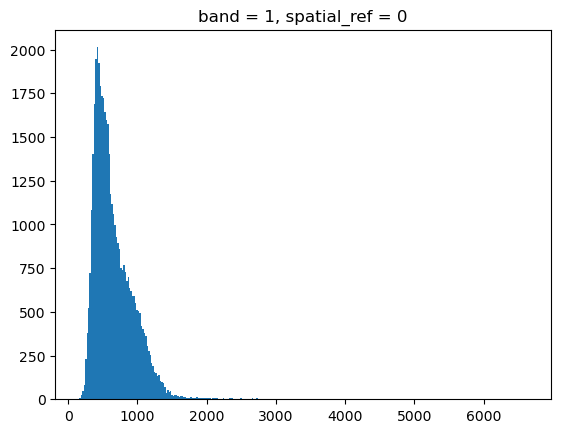

In [24]:
xds.sel(band=1).plot.hist(bins='auto'); # The semicolon tells Jupyter Notebook not to display the output of that line of code (i.e. the bin values; but it will show the histogram).

Similarly, we can plot 3-band combinations as true-color or false-color (color-infrared, CIR) image by selecting the bands to plot as RGB:

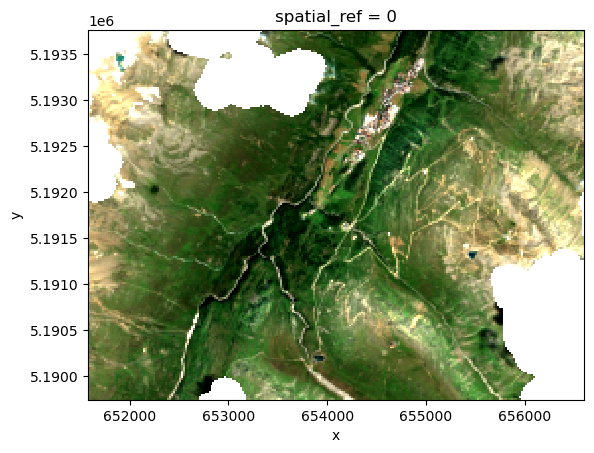

In [25]:
xds.sel(band=[3, 2, 1]).plot.imshow(robust=True)

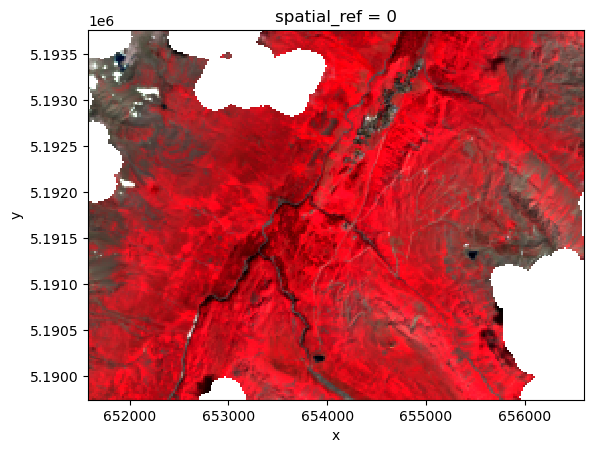

In [26]:
xds.sel(band=[4, 3, 2]).plot.imshow(robust=True)

Instead of using ```robust=True``` we could also constrain the color stretch to the respective quantiles using the ```vmin``` and ```vmax``` keyword arguments. Try also other quantiles or explicit values and see how this affects the image display.

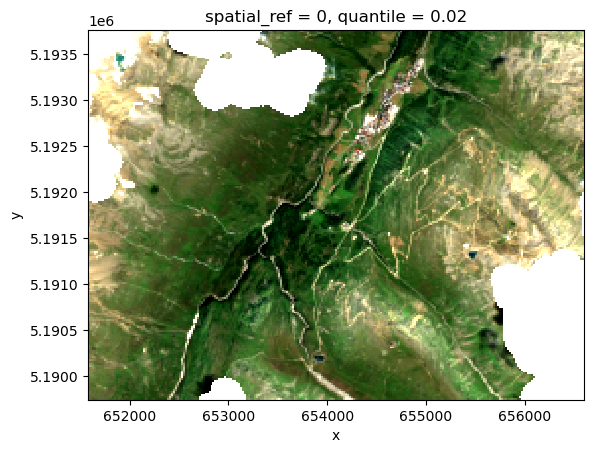

In [295]:
xds.sel(band=[3, 2, 1]).plot.imshow(
    vmin=xds.sel(band=[3, 2, 1]).quantile(0.02),
    vmax=xds.sel(band=[3, 2, 1]).quantile(0.98))

**That's nice, but how can we handle a remote sensing time series?**

### Loading many files of an image time series

We take a set of Sentinel-2 images downloaded originally from the Google Earth Engine and stored locally as GeoTIFFs (after you downloaded them as the folder `s2` from the course data repository). We load all these images as a DataArray and construct a DataSet from them. We follow more or less the approaches described [here](https://docs.dea.ga.gov.au/notebooks/Frequently_used_code/Opening_GeoTIFFs_NetCDFs.html#Multiple-GeoTIFFs) and [here](https://medium.com/@bonnefond.virginie/handling-multi-temporal-satellite-images-with-xarray-30d142d3391).

In [301]:
import glob
import os
from datetime import datetime

# Obtain a list of all files to load from the s2 directory (defined previously as in_dir) on your local system
geotiff_list = glob.glob(str(in_dir / '**TPS.tif')) # We use 'TPS' to constrain the granules with better coverage in our AOI which is covered by TPT and TPS granules.

# Helper function to get the datetime index from the filenames
def paths_to_datetimeindex(paths):
    return [datetime.strptime((os.path.basename(i)[0:8]), '%Y%m%d') for i in paths]

# Create a variable used for the time dimension
time_var = xarray.Variable('time', paths_to_datetimeindex(geotiff_list))

# Load in and concatenate all individual GeoTIFFs
S2_da = xarray.concat([rioxarray.open_rasterio(i, masked=True) for i in geotiff_list], dim=time_var)

# Convert the xarray.DataArray into an xarray.Dataset
S2_ds = S2_da.to_dataset('band')

# Rename the variables to the more useful band names
band_names = {1: 'B2', 2: 'B3', 3: 'B4', 4: 'B8', 5: 'B11', 6: 'B12'}     # A dictionary with the names of the Sentinel-2 bands exported earlier.
S2_ds = S2_ds.rename(band_names)

Now ```S2_ds``` is a DataSet with three dimensions (x, y, time) and six variables (the spectral bands). We add some attributes and fill them with metadata retrieved by the rio accessor. See the result:

In [302]:

# Fill in some of the missing metadata
S2_ds.attrs["crs"] = S2_ds.rio.crs
S2_ds.attrs["resolution"] = S2_ds.rio.resolution()
S2_ds.attrs["units"] = "meters"

S2_ds

<xarray.Dataset>
Dimensions:      (time: 335, y: 201, x: 251)
Coordinates:
  * x            (x) float64 6.516e+05 6.516e+05 ... 6.566e+05 6.566e+05
  * y            (y) float64 5.194e+06 5.194e+06 5.194e+06 ... 5.19e+06 5.19e+06
    spatial_ref  int32 0
  * time         (time) datetime64[ns] 2018-01-02 2018-01-12 ... 2021-09-08
Data variables:
    B2           (time, y, x) float32 nan nan nan nan ... 1.095e+03 nan nan
    B3           (time, y, x) float32 nan nan nan nan ... 1.351e+03 nan nan
    B4           (time, y, x) float32 nan nan nan nan ... 1.445e+03 nan nan
    B8           (time, y, x) float32 nan nan nan nan ... 2.208e+03 nan nan
    B11          (time, y, x) float32 nan nan nan nan ... 2.162e+03 nan nan
    B12          (time, y, x) float32 nan nan nan nan ... 1.658e+03 nan nan
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0
    crs:                     EPSG:32632
    resolution:              (20.0, -20.0)
    units:                   meters

A `spatial_ref` coordinate with length one was automatically created but is not needed. Let's get rid of this.

In [303]:
S2_ds = S2_ds.drop_vars(names='spatial_ref')    # Drop the variable with specified name
S2_ds

<xarray.Dataset>
Dimensions:  (time: 335, y: 201, x: 251)
Coordinates:
  * x        (x) float64 6.516e+05 6.516e+05 6.516e+05 ... 6.566e+05 6.566e+05
  * y        (y) float64 5.194e+06 5.194e+06 5.194e+06 ... 5.19e+06 5.19e+06
  * time     (time) datetime64[ns] 2018-01-02 2018-01-12 ... 2021-09-08
Data variables:
    B2       (time, y, x) float32 nan nan nan nan ... 1.095e+03 nan nan
    B3       (time, y, x) float32 nan nan nan nan ... 1.36e+03 1.351e+03 nan nan
    B4       (time, y, x) float32 nan nan nan nan ... 1.445e+03 nan nan
    B8       (time, y, x) float32 nan nan nan nan ... 2.208e+03 nan nan
    B11      (time, y, x) float32 nan nan nan nan ... 1.98e+03 2.162e+03 nan nan
    B12      (time, y, x) float32 nan nan nan nan ... 1.56e+03 1.658e+03 nan nan
Attributes:
    AREA_OR_POINT:           Area
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    scale_factor:            1.0
    add_offset:              0.0
    crs:                     EPSG:32632
    resolution:              (20.0, -20.0)
    units:                   meters

## Working with images and time series

### Plotting

As a next step we will explore some of the xarray plotting possibilities with our image time series. If you need more advanced functionality, try out more specialized packages (such as Cartopy for making maps and hvplot for interactive plots, see [this tutorial](https://tutorial.xarray.dev/scipy-tutorial/04_plotting_and_visualization.html#)).


First, select one scene and one band and plot this:

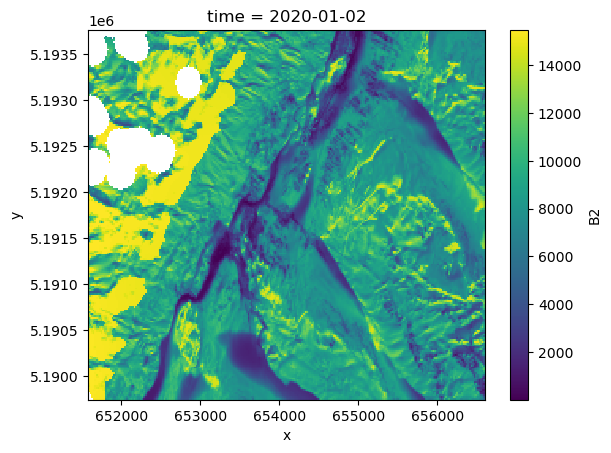

In [304]:
S2_ds.B2.sel(time='2020-01-02').plot()

Other possibilities for plotting include scatter plots, e.g. with two bands plotted against each other:

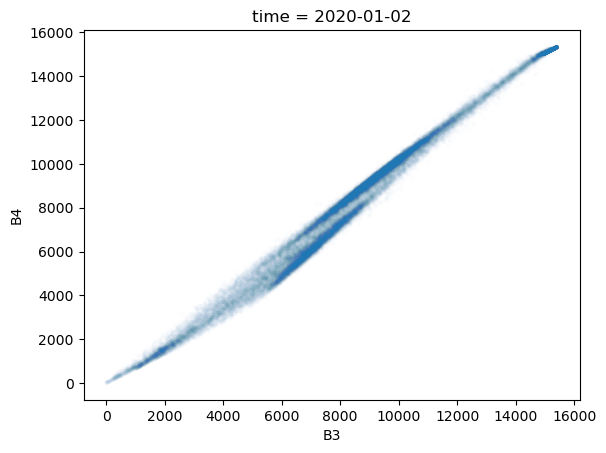

In [85]:
S2_ds.sel(time='2020-01-02').plot.scatter(x='B3', y='B4', marker='.', edgecolor='none', alpha=0.01)

Let's see how many valid observations we have for each pixel.

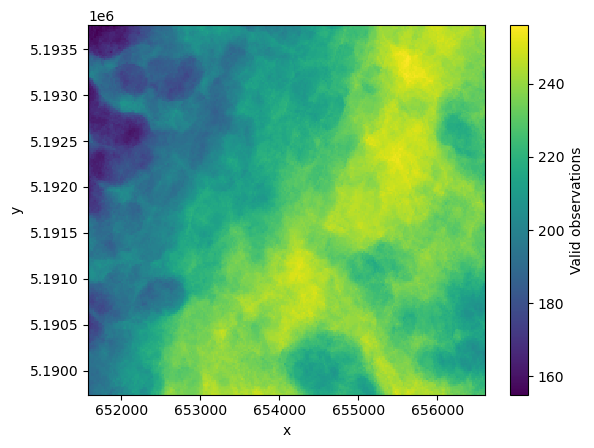

In [95]:
S2_count = S2_ds.B2.count(dim='time')   # Count valid data values of one band along the time dimension
S2_count = S2_count.rename(new_name_or_name_dict='Valid observations')
S2_count.plot()

To plot an RGB image we create a new DataArray with the respective bands from our DataSet, then plot this.

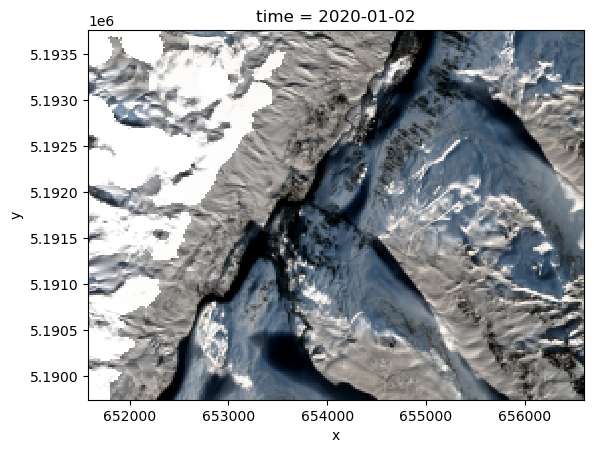

In [131]:
S2_RGB_da = S2_ds[['B4', 'B3', 'B2']].sel(time='2020-01-02').to_array()
S2_RGB_da.plot.imshow(robust=True)

Plot multiple observations within a defined time period, one band only:

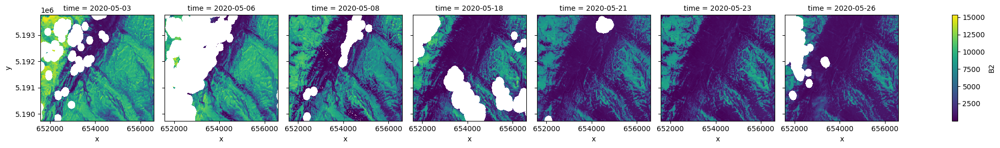

In [132]:
S2_ds.B2.sel(time='2020-05').plot.imshow(col='time')

The same for a 3-band combination (here SWIR-1, near-infrared and blue) and a longer time period:

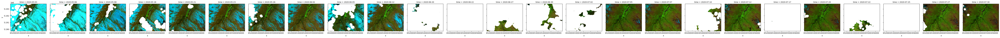

In [133]:
# Create a new DataArray with the respective bands and time period, then plot this
S2_RGB_da = S2_ds[['B11', 'B8', 'B2']].sel(time=slice('2020-05-01', '2020-07-31')).to_array()
S2_RGB_da.plot.imshow(col='time', robust=True)

### Band calculations

As an example for xarray's raster calculator functionality we calculate the Normalized Difference Snow Index (NDSI; [Hall et al. 1995](https://doi.org/10.1016/0034-4257(95)00137-P)) for the entire Sentinel-2 time series. 
Instead of creating new DataArray with NDSI, we add it as a new variable to our Sentinel-2 DataSet. This helps to keep our data organised and when we plot, the colormap is directly labelled by the variable name 'NDSI' and we do not need to call matplotlib and use cbar_kwargs like [here](https://xarray.pydata.org/en/v2022.03.0/examples/visualization_gallery.html).

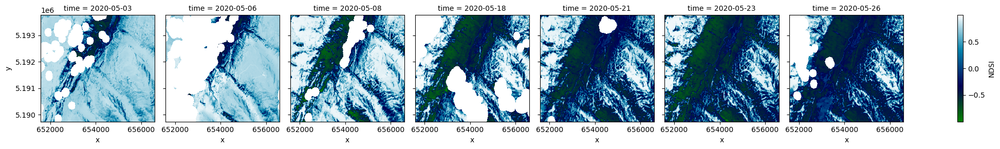

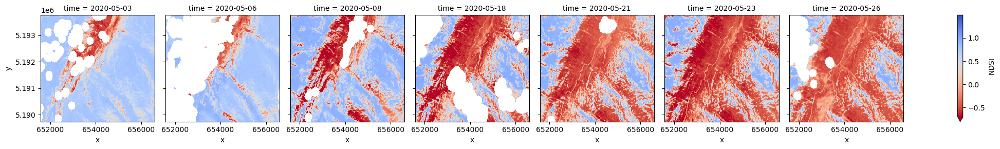

In [134]:
# Compute the NDSI from the SWIR-1 (B11) and green (B3) bands and add as a new variable to our Sentinel-2 DataSet
S2_ds['NDSI'] = (S2_ds.B3 - S2_ds.B11) / (S2_ds.B3 + S2_ds.B11)

# Define NDSI as a new variable to have a shortcut, keep in mind that NDSI is a variable of our Sentinel-2 DataSet
NDSI = S2_ds.NDSI

# Show the resulting rasters of one month
# for other colormaps see https://matplotlib.org/stable/gallery/color/colormap_reference.html
NDSI.sel(time='2020-05').plot(col='time', cmap='ocean')
NDSI.sel(time='2020-05').plot(col='time', cmap='coolwarm_r', center=0.4, robust=True)    # center cmap around 0.4, a typical threshold for snow discrimination

### Time series interpolation

For temporal interpolation and aggregation xarray contains some very useful functionality, and much of this works similar as with Pandas. In the rather short time series above we can see the snow disappearing and we also encounter different amounts of valid pixels (white NoData pixels should result from cloud-masking). As a next step, we will fill missing values with different methods.

Can you explain the method-specific differences in the resulting images? Why does the linear interpolation not fill all missing values?

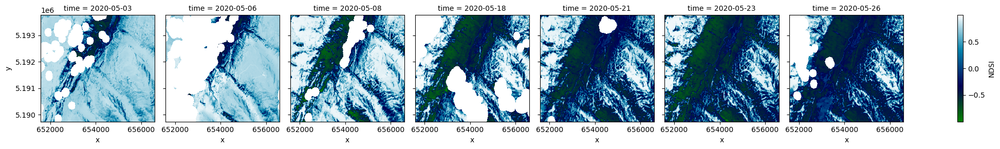

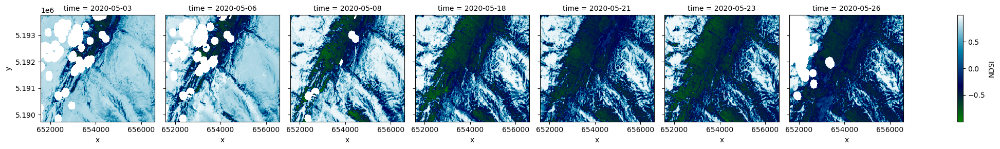

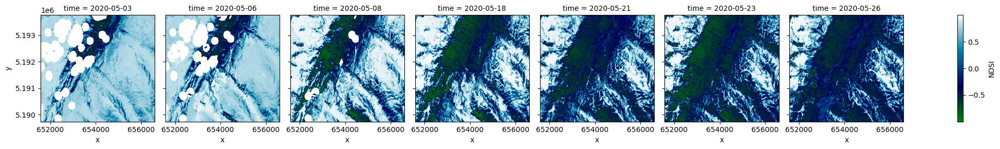

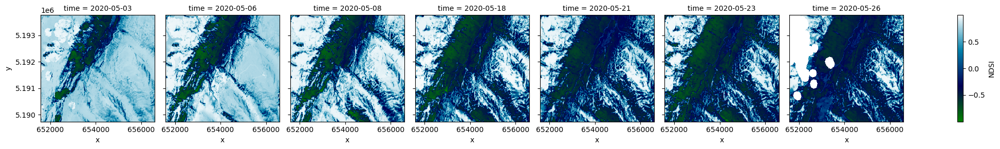

In [135]:
# Plot the original (observed) NDSI values for one month
NDSI.sel(time='2020-05').plot(col='time', cmap='ocean')

# Interpolate missing values in these images and plot (default: linear interpolation)
NDSI.sel(time='2020-05').interpolate_na(dim='time').plot(col='time', cmap='ocean')#(time=new_dates)

# Forward fill missing values in these images and plot (requires the bottleneck package to be installed)
NDSI.sel(time='2020-05').ffill(dim='time').plot(col='time', cmap='ocean')

# Backward fill missing values in these images and plot
NDSI.sel(time='2020-05').bfill(dim='time').plot(col='time', cmap='ocean')

Via matplotlib we have many options for customizing plots (e.g., create subplots), and here we use xarray's possibility to make line plots directly from a DataArray:

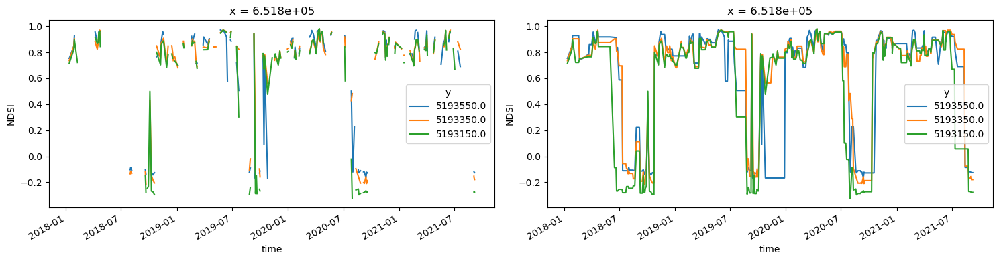

In [140]:
import matplotlib.pyplot as plt                         # for extended plotting functionality

fig, axes = plt.subplots(1, 2, figsize=(15, 4))         # make two subplots next to each other

# Plot NDSI from the original time series
NDSI.isel(x=10, y=[10, 20, 30]).plot.line(ax=axes[0], x='time')

# Forward fill missing values of the entire NDSI time series, select a few locations with constant x and plot the NDSI against time
NDSI.ffill(dim='time').isel(x=10, y=[10, 20, 30]).plot.line(ax=axes[1], x='time')

plt.tight_layout()

... or heatmaps:

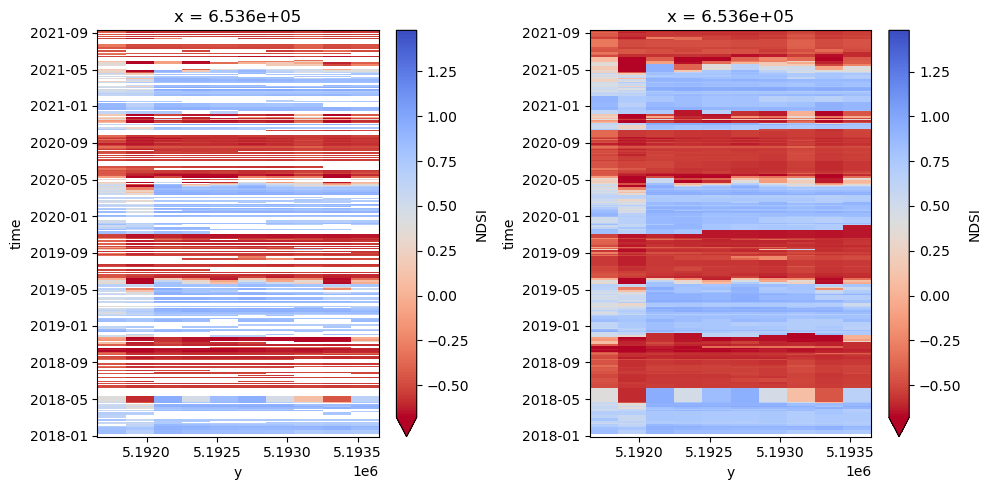

In [141]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))            # make two subplots next to each other

# Plot NDSI heatmap from the original time series (values at locations with constant x and varying y)
NDSI.isel(x=100, y=[10, 20, 30, 40, 50, 60, 70, 80, 90, 100]).plot(ax=axes[0], cmap='coolwarm_r', center=0.4, robust=True)

# Forward fill missing values of the entire NDSI time series, select a few locations with constant x and plot the NDSI heatmap
NDSI.ffill(dim='time').isel(x=100, y=[10, 20, 30, 40, 50, 60, 70, 80, 90, 100]).plot(ax=axes[1], cmap='coolwarm_r', center=0.4, robust=True)

plt.tight_layout()

It is also possible to interpolate other time steps (not covered by a Sentinel-2 overpass). Of course, such processing steps must be used carefully and considered during further analysis and interpretation. Note that the last "new" date cannot be interpolated because there is now data (in the selected subset) after this date.

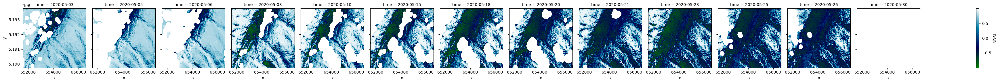

In [142]:
# Interpolate new dates and create a new DataArray
new_dates = ['2020-05-05', '2020-05-10', '2020-05-15', '2020-05-20', '2020-05-25', '2020-05-30']
NDSI_new_dates_da = NDSI.sel(time='2020-05').interp(time=new_dates)

# Concatenate original data and data for new dates, and sort by 'time' (to maintain a chronological order)
NDSI_all_dates_da = xarray.concat(objs=[NDSI.sel(time='2020-05'), NDSI_new_dates_da], dim='time').sortby('time')

# Plot 
NDSI_all_dates_da.plot(col='time', cmap='ocean')

### Time series aggregation

Aggregating over temporal units is straightforward thanks to the time indexing. Here we group all observations of our NDSI time series by month and calculate the averages over these groups, then plot the resulting monthly composite rasters. This temporal aggregation gives a good impression of the typical snow cover distribution in our mountainous area-of-interest across the year.

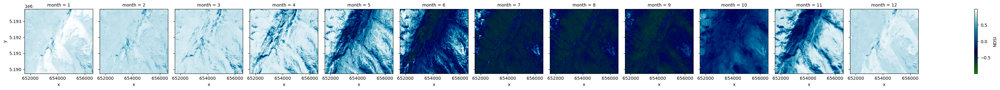

In [146]:
NDSI.groupby('time.month').mean(dim='time').plot(col='month', cmap='ocean')

If we are interested in the variation of snow cover in different months, we can calculate the variance (or the standard deviation) over the months:

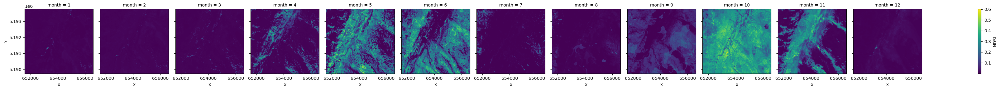

In [148]:
# Group by month and compute the variance of NDSI, then plot
NDSI.groupby('time.month').var(dim='time').plot(col='month')

... or over seasons (named by the months' first letters):

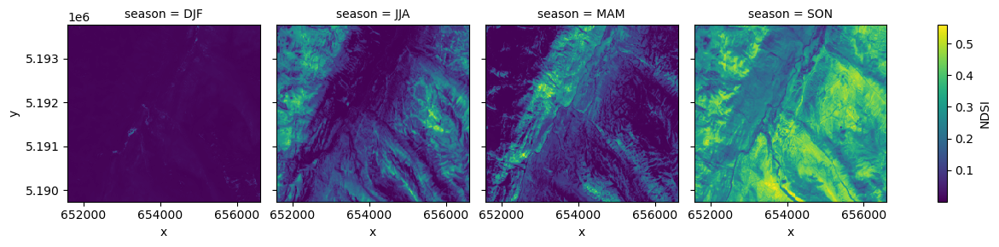

In [153]:
# Group by seasons and compute the variance of NDSI, then plot
# I would prefer a chronological order of seasons but cannot get this easily
NDSI.groupby('time.season').var(dim='time').plot(col='season')

Now let's have a look at monthly NDSI aggregates of different years. We resample to one month temporal resolution by computing the mean, then make a facet plot with 12 columns, so that we get each year in a separate row.

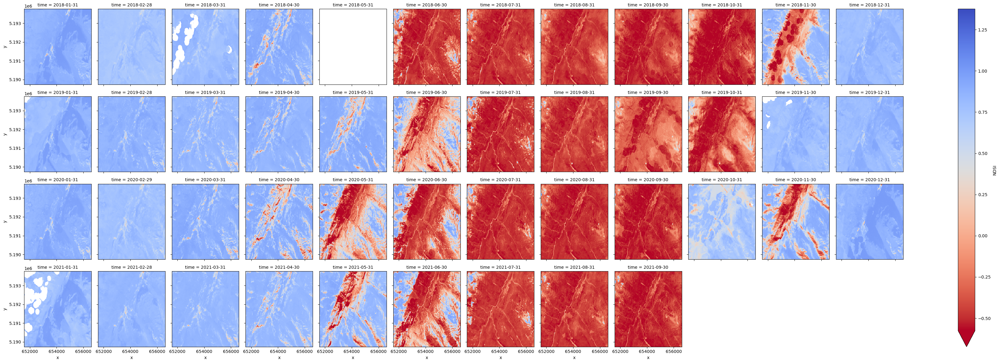

In [154]:
NDSI.resample(time='1M').mean().plot(col='time', col_wrap=12, cmap='coolwarm_r', center=0.4, robust=True)

There seem to be no images from May 2018 (resulting in a NoData aggregate), and we may be interested in the number of observations for all other months as well. Using ```count()``` instead of ```mean()```, we can inspect the number of valid observations per month:

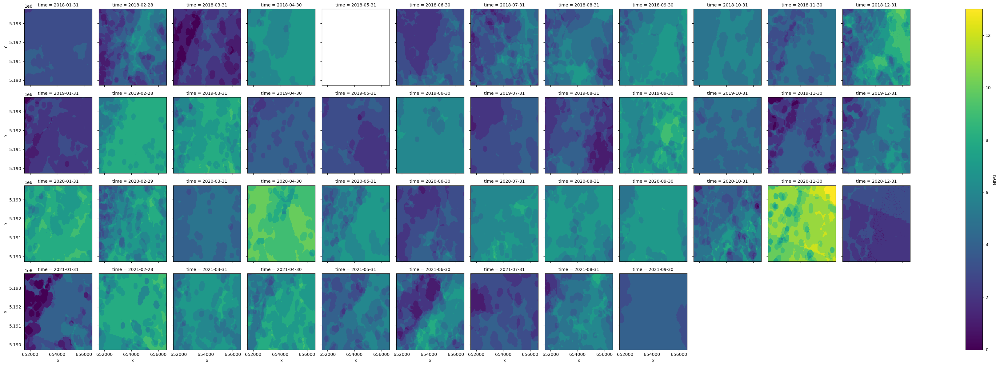

In [155]:
NDSI.resample(time='1M').count().plot(col='time', col_wrap=12)

### Time series smoothing

A couple of other operations related to time series processing are straightforward with xarrays, such as smoothing and filtering with [rolling windows](https://docs.xarray.dev/en/stable/generated/xarray.DataArray.rolling.html).

To test such methods, we first resample to a higher temporal resolution ("upsampling" in the xarrays documentation) by linear interpolation. This will not work if there are duplicates in the time index (e.g. due to S2 products sensed on the same day but available in two versions with different product generation time stamps). Then you will get an "InvalidIndexError" (Reindexing only valid with uniquely valued Index objects). So we treat the duplicates first, e.g. by searching, printing and removing them.

In [156]:
# We use pandas' .duplicated() to check for duplicates
import pandas as pd

# Print the dates with duplicates
for i,j in zip(pd.Index(NDSI['time']).duplicated(), NDSI['time'].values):
    if i == True:
        print(j)

2019-03-28T00:00:00.000000000
2020-10-18T00:00:00.000000000
2020-10-28T00:00:00.000000000
2020-11-17T00:00:00.000000000
2020-11-27T00:00:00.000000000
2020-12-17T00:00:00.000000000
2021-01-16T00:00:00.000000000
2021-02-15T00:00:00.000000000
2021-09-03T00:00:00.000000000


In [157]:
# Remove duplicates and keep only the first occurrences (default: keep='first')) in a new DataArray with unique time index
NDSI_unique = NDSI.drop_duplicates('time')

# Compare the shape of the two DataArrays
print(NDSI.shape)
print(NDSI_unique.shape)

(335, 201, 251)
(326, 201, 251)


Now we resample to one day temporal resolution and fill daily values by linear interpolation between observations.

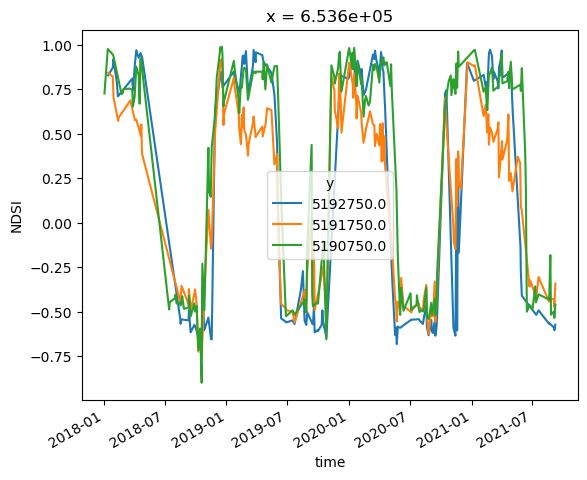

In [158]:
# Resample to 1 day temporal resolution
NDSI_interpolated = NDSI_unique.resample(time='1d').interpolate()

# Interpolate the missing values along the time dimension
NDSI_interpolated = NDSI_interpolated.interpolate_na(dim='time')

# Plot the resulting time series at three points
NDSI_interpolated.isel(x=100, y=[50, 100, 150]).plot.line(x='time')

# Or in one line of code
#NDSI_unique.resample(time='1d').interpolate().interpolate_na(dim='time').isel(x=100, y=[50, 100, 150]).plot.line(x='time')

Compute the 30-day rolling average of the NDSI time series and plot for one point (aggregation results are assigned the coordinate at the end of each window by default, but can be centered by passing center=True when constructing the rolling object):

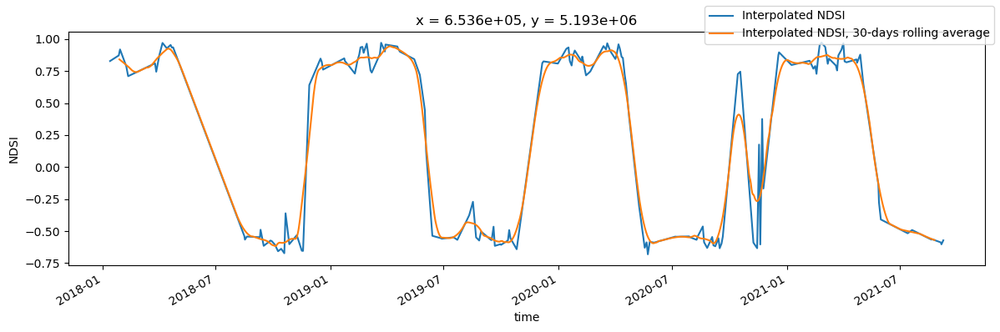

In [159]:
# Set up the plot
fig, axes = plt.subplots(1, 1, figsize=(12, 4))

# The daily NDSI values
NDSI_interpolated.isel(x=100, y=50).plot.line(label='Interpolated NDSI')

# Take the mean value over the NDSI values in a 30-day rolling window and plot the time series for one specific point
NDSI_interpolated.rolling(time=30, center=True).mean().isel(x=100, y=50).plot.line(label='Interpolated NDSI, 30-days rolling average')

# Show the legend and show the plot
fig.legend()
plt.tight_layout()